# Обучение модели классификации ортогонального поворота текста (OCR)
- Автор: Кирилл Киселев
- Дата начала: 27.06.2022
- Цель: обучить классификатор ортогонального поворота текста.

## 1. Загруза необходимых библиотек

In [1]:
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import RandomCrop, ToTensor, Grayscale
from sklearn.model_selection import train_test_split
import random
from typing import List
from PIL import Image
from pathlib import Path
import numpy as np
import cv2

import torchvision
import torch

import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

import pytesseract
from pytesseract import Output

from sklearn.metrics import accuracy_score

/home/kirillk/PycharmProjects/ocr_data_generation/venv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
torch.cuda.is_available()

/home/kirillk/PycharmProjects/ocr_data_generation/venv/lib/python3.9/site-packages/torch/cuda/__init__.py:82: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


False

## 2. Глобальные перменные

In [6]:
DATA_PATH = Path('/home/kirillk/datasets/OCR/ocr_ortho_classifier/')

In [7]:
data_list = [*DATA_PATH.glob('*.jpg')]
data_list

[PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/312.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/108.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/204.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/280.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/134.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/353.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/360.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/345.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/145.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/250.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/020.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/245.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/172.jpg'),
 PosixPath('/home/kirillk/datasets/OCR/ocr_ortho_classifier/030.jpg'),
 Posix

## 3. Необходимые функции

In [8]:
def plot(imgs, with_orig=True, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

## 4. Предварительные исследования

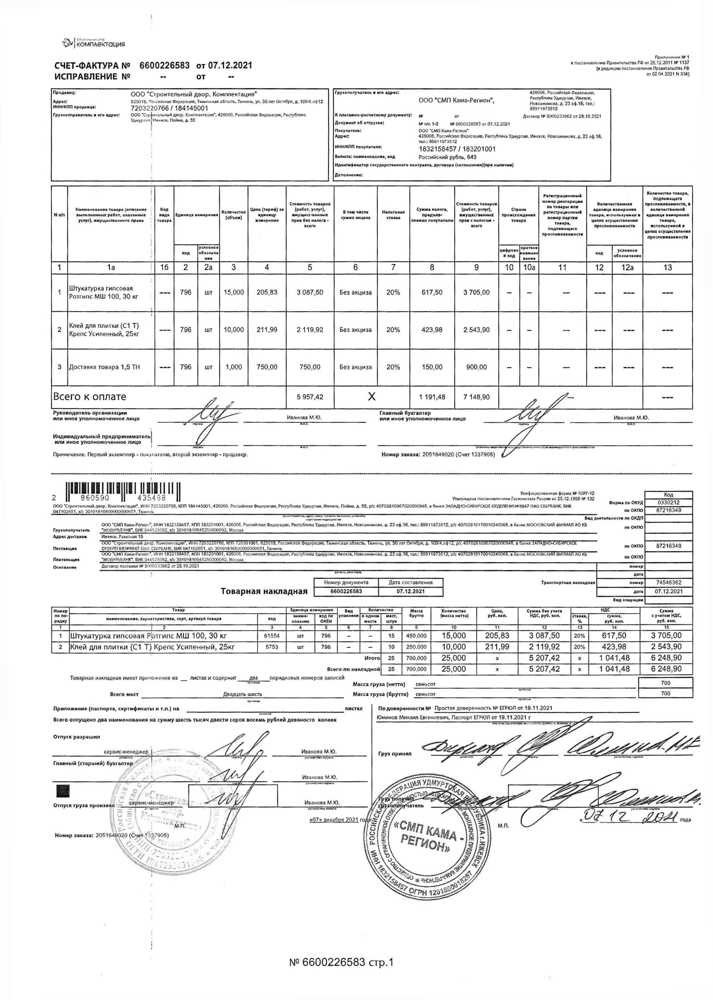

In [9]:
orig_img = Image.open(data_list[0])
orig_img

In [10]:
np.asarray(orig_img).mean()

237.67144521497292

### Работа с кропами

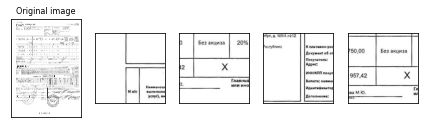

In [11]:
cropper = RandomCrop(size=(500, 500))
crops = [cropper(orig_img) for _ in range(4)]
plot(crops)

In [12]:
for crop in crops:
    gray_crop = Grayscale()(crop)
    print(np.asarray(gray_crop).mean())
#     print(ToTensor()(crop).numpy().mean())

244.745488
239.597076
233.43438
236.258808


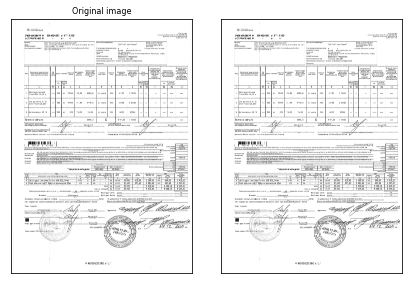

In [13]:
gray_img = Grayscale()(orig_img)
plot([gray_img], cmap='gray')

In [14]:
gray_crop = Grayscale()(crops[0])

In [15]:
gray_tensor = ToTensor()(gray_crop).numpy()
gray_tensor.mean()

0.95978624

In [16]:
gray_tensor.mean() < 0.9

False

### Вывод:
Среднее значение полностью белого кропа равно 1.
Предварительный порог белого 0.9

### Работа с поворотом

In [17]:
rotated_crops = []

for crop in crops:
    rotated_crops.append(crop.rotate(270))

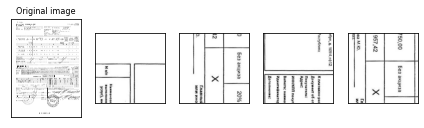

In [18]:
plot(rotated_crops)

## 5. Реализация класса Dataset

In [19]:
class DataGenerationDataset(Dataset):
    def __init__(self,
                 img_dir: Path,
                 crop_size: int,
                 white_threshold: int,
                 transform: bool = False,
                 transform_list: List[int] = []):
        
        self.transform = transform
        self.image_list = [*img_dir.glob('*.jpg')]
        self.crop_size = crop_size
        self.white_threshold = white_threshold
        self.transform_list = transform_list

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, 
                    idx: int):
        img_path = self.image_list[idx]
        
        image = Image.open(img_path)
        
        transforms = Compose([
            RandomCrop(size=(self.crop_size, self.crop_size)),
            Grayscale(),
        ])
        
        flag=True        
        
        while flag:
            crop = transforms(image)
            gray_tensor_mean = np.asarray(crop).mean()

            if gray_tensor_mean < self.white_threshold:
                flag = False
        
        if self.transform:
            assert self.transform_list != []
            rotation_angle = random.choice(self.transform_list)
            crop = crop.rotate(rotation_angle)
            tensor = ToTensor()(crop)
        else:
            rotation_angle = 0

        return tensor, rotation_angle

In [20]:
data = DataGenerationDataset(img_dir=DATA_PATH, 
                             transform=True,
                             transform_list=[90, 180, 270],
                             crop_size=500,
                             white_threshold=240)

In [21]:
len(data)

403

In [22]:
img, lab= data[0]

In [23]:
lab

180

In [24]:
img

tensor([[[0.7569, 0.8824, 0.9843,  ..., 1.0000, 1.0000, 1.0000],
         [0.4902, 0.7765, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         [0.3020, 0.6784, 0.9725,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]]])

## 6. Реализация DataLoader

In [25]:
dataloader = DataLoader(data, batch_size=4, shuffle=True, num_workers=0)

Feature batch shape: torch.Size([4, 1, 500, 500])
Labels batch shape: torch.Size([4])


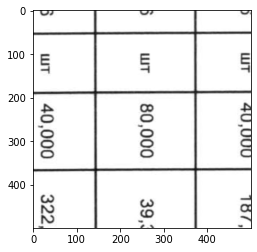

torch.Size([500, 500])
Label: 270


In [26]:
train_features, train_labels = next(iter(dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[0].squeeze()
label = train_labels[0]

plt.imshow(img, cmap='gray')
plt.show()
print(img.shape)
print(f"Label: {label}")


## 7. Загрузка модели

In [29]:
mobilenet = torchvision.models.mobilenet_v3_small()
mobilenet.features[0][0].in_channels = 1
a = torch.randn(1, 3, 500, 500)
mobilenet

MobileNetV3(
  (features): Sequential(
    (0): ConvNormActivation(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): ConvNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): SqueezeExcitation(
          (avgpool): AdaptiveAvgPool2d(output_size=1)
          (fc1): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
          (fc2): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1))
          (activation): ReLU()
          (scale_activation): Hardsigmoid()
        )
        (2): ConvNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride

In [30]:
from pathlib import Path
import cv2

images = sorted(data_list)

for path in images:
    im = cv2.imread(str(path))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    print(im.mean())

252.70206671175322
252.05778279074283
251.87254040298882
252.0183482443879
251.8440811188698
250.94017484237565
251.81406823925187
251.3639622977907
251.24910270210793
251.3312576845976
252.22738955365116
252.17323401006777
252.18961525881195
252.92760813320058
252.61098966519106
251.67547515410845
252.6588751243781
252.34079541001657
251.81388778441226
251.4603242217289
251.3262146800904
251.46034326492565
251.75953849597693
252.00565164876247
252.01794604813196
252.73195493847635
251.38416236857617
251.25329268868904
251.38927933570946
251.78695213049187
252.0003199343791
251.9559426576634
251.02440036990407
252.69349954264484
251.84406042741193
251.81689013941065
251.85040904435098
251.7588209316444
251.86861832700345
251.39862205674908
251.71011636707797
252.13555765832666
251.35507394859144
251.44122257188366
251.4316195447037
252.22392945089
252.20269786457837
252.26173414103397
252.1123542423751
252.09125741838238
251.52883405246675
251.7619894679548
252.3169159314418
252.370441